In [1]:
# working directory 설정
import os 
os.chdir("C:/Users/user/github/DACON/WineQualityClassification")

In [11]:
# 데이터 불러오기
import pandas as pd
train=pd.read_csv("./data/train.csv")
test=pd.read_csv("./data/test.csv")
train= train.drop("index", axis = 1)
test= test.drop("index", axis = 1)
train

,quality,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,type
0,5,5.6,0.695,0.06,6.8,0.042,9.0,84.0,0.99432,3.44,0.44,10.2,white
1,5,8.8,0.610,0.14,2.4,0.067,10.0,42.0,0.99690,3.19,0.59,9.5,red
2,5,7.9,0.210,0.39,2.0,0.057,21.0,138.0,0.99176,3.05,0.52,10.9,white
3,6,7.0,0.210,0.31,6.0,0.046,29.0,108.0,0.99390,3.26,0.50,10.8,white
4,6,7.8,0.400,0.26,9.5,0.059,32.0,178.0,0.99550,3.04,0.43,10.9,white
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5492,5,7.7,0.150,0.29,1.3,0.029,10.0,64.0,0.99320,3.35,0.39,10.1,white
5493,6,6.3,0.180,0.36,1.2,0.034,26.0,111.0,0.99074,3.16,0.51,11.0,white
5494,7,7.8,0.150,0.34,1.1,0.035,31.0,93.0,0.99096,3.07,0.72,11.3,white
5495,5,6.6,0.410,0.31,1.6,0.042,18.0,101.0,0.99195,3.13,0.41,10.5,white


In [23]:
# 데이터 타입 및 결측치 확인
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5497 entries, 0 to 5496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   quality               5497 non-null   int64  
 1   fixed acidity         5497 non-null   float64
 2   volatile acidity      5497 non-null   float64
 3   citric acid           5497 non-null   float64
 4   residual sugar        5497 non-null   float64
 5   chlorides             5497 non-null   float64
 6   free sulfur dioxide   5497 non-null   float64
 7   total sulfur dioxide  5497 non-null   float64
 8   density               5497 non-null   float64
 9   pH                    5497 non-null   float64
 10  sulphates             5497 non-null   float64
 11  alcohol               5497 non-null   float64
 12  type                  5497 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 558.4+ KB


In [21]:
# 데이터 타입이 모두 숫자형이고 label 은 object 이므로 label 을 숫자형으로 변환
red_index=train[train['type']=='red'].index
white_index=train[train['type']=='white'].index
# red = 0, white = 1
train['type'][red_index] = 0
train['type'][white_index] = 1
#pd.factorize(train['type'])[0]
train

C:\Users\user\AppData\Local\Temp\ipykernel_27712\2371054188.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['type'][red_index] = 0
C:\Users\user\AppData\Local\Temp\ipykernel_27712\2371054188.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['type'][white_index] = 1


,quality,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,type
0,5,5.6,0.695,0.06,6.8,0.042,9.0,84.0,0.99432,3.44,0.44,10.2,1
1,5,8.8,0.610,0.14,2.4,0.067,10.0,42.0,0.99690,3.19,0.59,9.5,0
2,5,7.9,0.210,0.39,2.0,0.057,21.0,138.0,0.99176,3.05,0.52,10.9,1
3,6,7.0,0.210,0.31,6.0,0.046,29.0,108.0,0.99390,3.26,0.50,10.8,1
4,6,7.8,0.400,0.26,9.5,0.059,32.0,178.0,0.99550,3.04,0.43,10.9,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5492,5,7.7,0.150,0.29,1.3,0.029,10.0,64.0,0.99320,3.35,0.39,10.1,1
5493,6,6.3,0.180,0.36,1.2,0.034,26.0,111.0,0.99074,3.16,0.51,11.0,1
5494,7,7.8,0.150,0.34,1.1,0.035,31.0,93.0,0.99096,3.07,0.72,11.3,1
5495,5,6.6,0.410,0.31,1.6,0.042,18.0,101.0,0.99195,3.13,0.41,10.5,1


In [27]:
# 데이터 전처리를 위한 분석 1
train.describe(include = 'all')

,quality,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,type
count,5497.000000,5497.000000,5497.000000,5497.000000,5497.000000,5497.000000,5497.000000,5497.000000,5497.000000,5497.000000,5497.000000,5497.000000,5497.0
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4159.0
mean,5.818992,7.210115,0.338163,0.318543,5.438075,0.055808,30.417682,115.566491,0.994673,3.219502,0.530524,10.504918,NaN
std,0.870311,1.287579,0.163224,0.145104,4.756676,0.034653,17.673881,56.288223,0.003014,0.160713,0.149396,1.194524,NaN
min,3.000000,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.740000,0.220000,8.000000,NaN
25%,5.000000,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,78.000000,0.992300,3.110000,0.430000,9.500000,NaN
50%,6.000000,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994800,3.210000,0.510000,10.300000,NaN
75%,6.000000,7.700000,0.400000,0.390000,8.100000,0.064000,41.000000,155.000000,0.996930,3.320000,0.600000,11.300000,NaN


In [30]:
# 데이터 전처리를 위한 분석 2
import pandas_profiling as pp
train.profile_report()

C:\Users\user\AppData\Local\Temp\ipykernel_27712\3708571002.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pp


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, "The Description of the 'Quality' Variable")

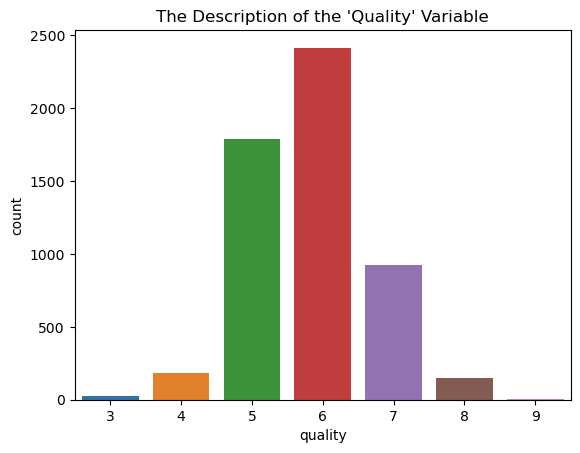

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

y=train['quality'].value_counts()
sns.countplot(train['quality'])
plt.title("The Description of the 'Quality' Variable")

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\user\anaconda3\l

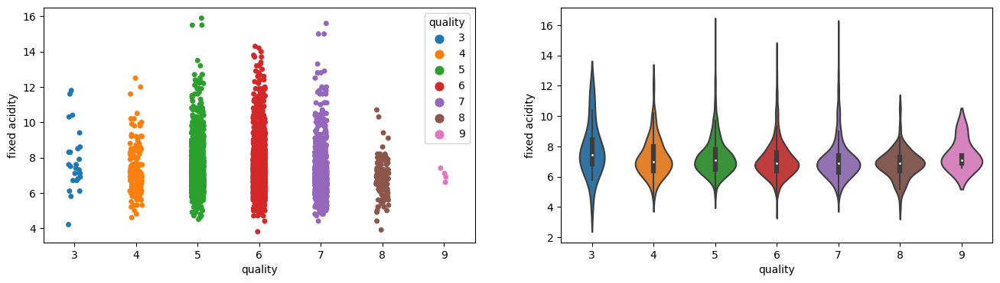

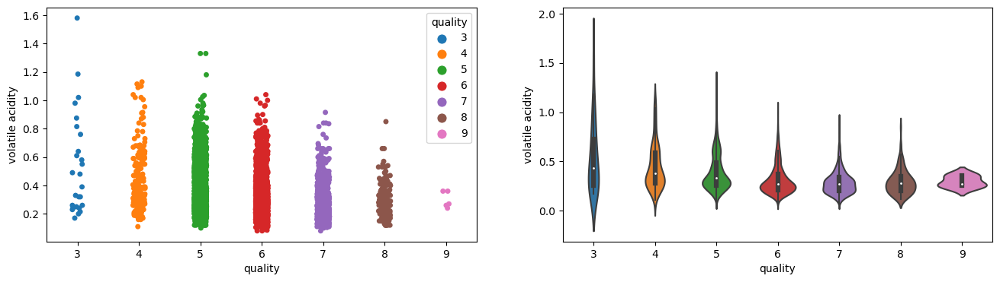

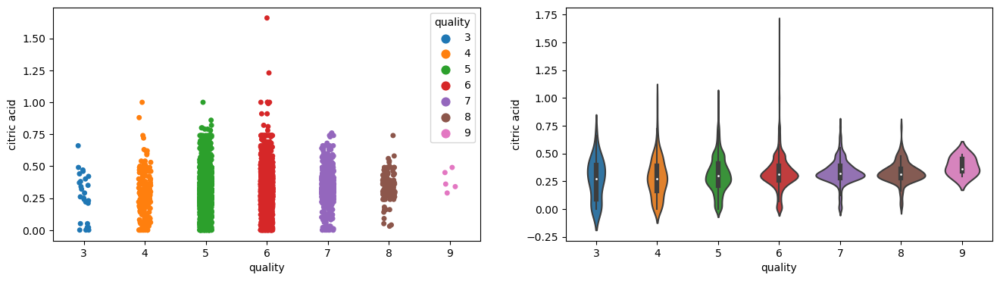

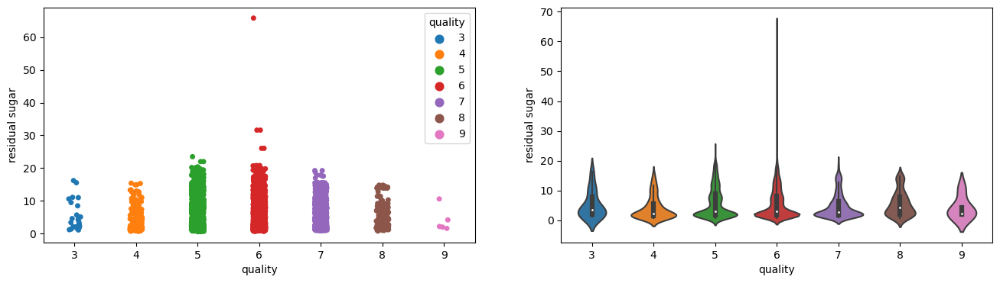

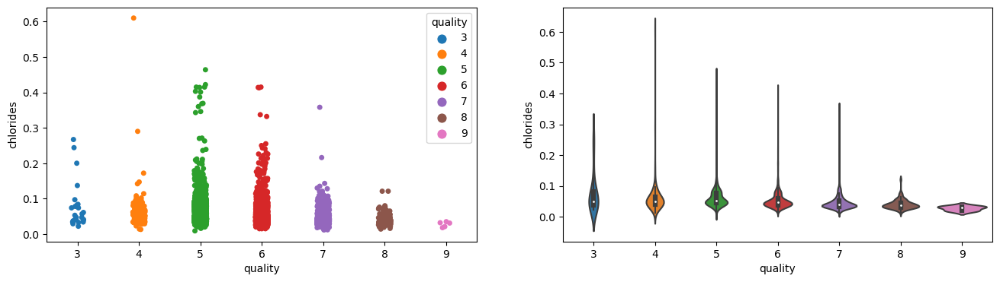

...

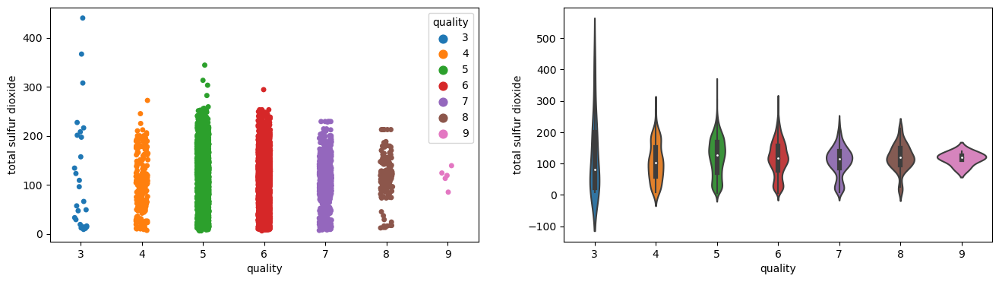

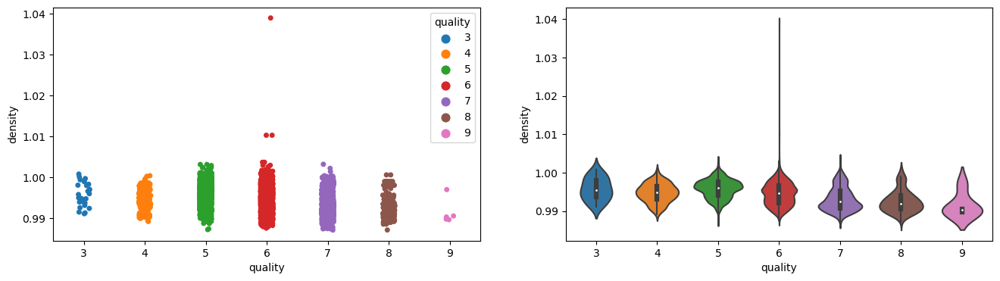

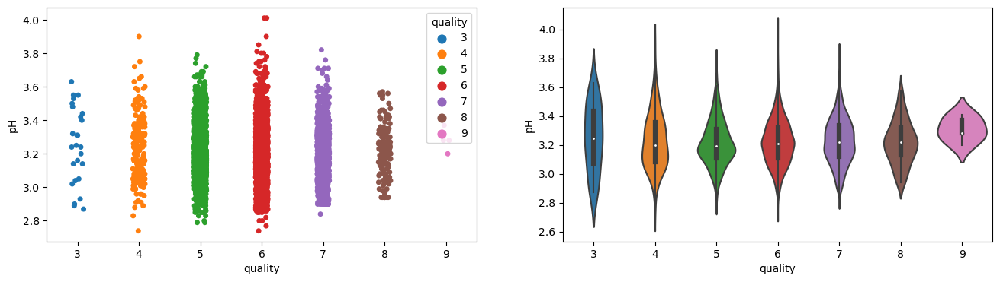

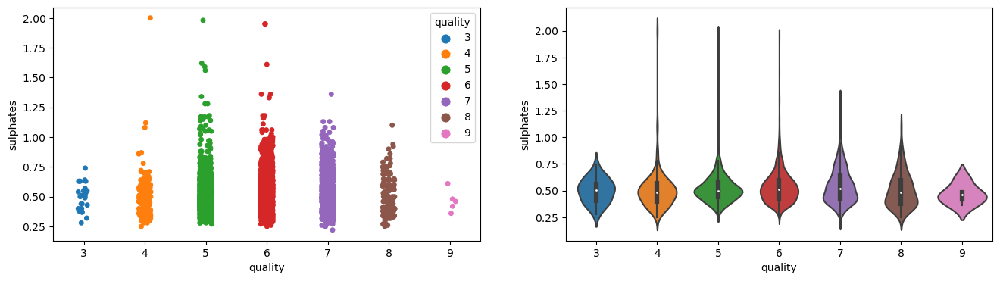

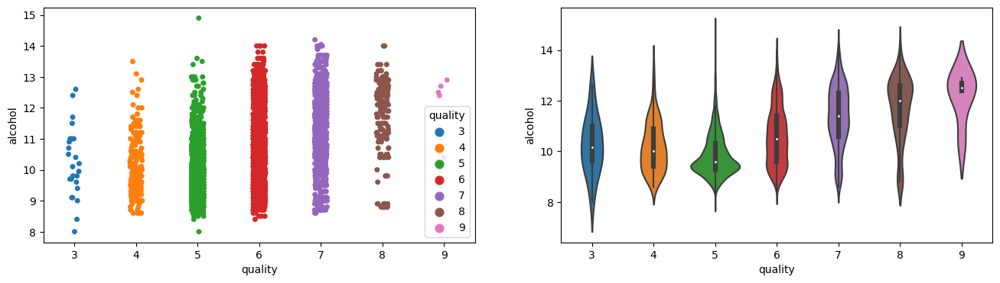

In [45]:
numerical_columns=train.select_dtypes(exclude = 'object').columns.tolist()
numerical_columns.remove('quality')

def show_dist_plot(df, columns):
    for column in columns:
        f, ax = plt.subplots(1,2, figsize = (16,4))
        sns.stripplot(df['quality'],df[column],ax = ax[0], hue = df['quality'])
        sns.violinplot(df['quality'],df[column],ax = ax[1])
show_dist_plot(train, numerical_columns)

<AxesSubplot:>

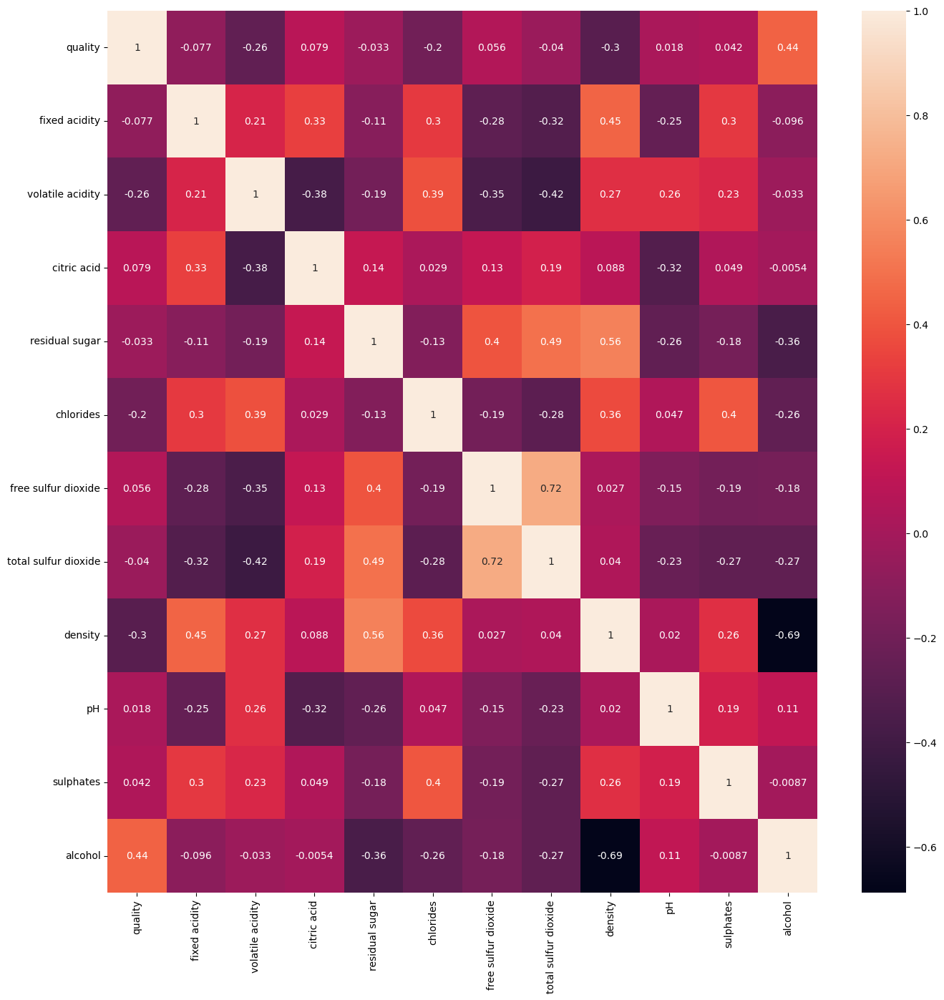

In [53]:
plt.figure(figsize = (16,16))
corr=train.corr()
sns.heatmap(corr, annot = True)

In [57]:
#modeling
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression, Ridge
from sklearn.metrics import plot_roc_curve,accuracy_score, confusion_matrix, plot_confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier

In [58]:
# 표준화
scaler = StandardScaler()
train[numerical_columns] = scaler.fit_transform(train[numerical_columns])
test[numerical_columns] = scaler.transform(test[numerical_columns])

In [60]:
train.describe(include='all')

,quality,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,type
count,5497.000000,5.497000e+03,5.497000e+03,5.497000e+03,5.497000e+03,5.497000e+03,5.497000e+03,5.497000e+03,5.497000e+03,5.497000e+03,5.497000e+03,5.497000e+03,5497.0
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4159.0
mean,5.818992,-2.109565e-17,-9.300668e-17,-3.873763e-17,-3.732385e-17,2.563995e-17,-5.590499e-17,6.332735e-17,1.980507e-14,2.223556e-15,1.005805e-17,-2.348494e-16,NaN
std,0.870311,1.000091e+00,1.000091e+00,1.000091e+00,1.000091e+00,1.000091e+00,1.000091e+00,1.000091e+00,1.000091e+00,1.000091e+00,1.000091e+00,1.000091e+00,NaN
min,3.000000,-2.648711e+00,-1.581787e+00,-2.195474e+00,-1.017205e+00,-1.350876e+00,-1.664624e+00,-1.946703e+00,-2.509732e+00,-2.983864e+00,-2.078720e+00,-2.097193e+00,NaN
25%,5.000000,-6.292338e-01,-6.627228e-01,-4.724138e-01,-7.649052e-01,-5.139393e-01,-7.592505e-01,-6.674559e-01,-7.875447e-01,-6.814112e-01,-6.729308e-01,-8.413478e-01,NaN
50%,6.000000,-1.632006e-01,-2.950971e-01,-5.887933e-02,-5.126052e-01,-2.542002e-01,-8.022071e-02,4.323694e-02,4.202510e-02,-5.912665e-02,-1.373920e-01,-1.715639e-01,NaN
75%,6.000000,3.805048e-01,3.788835e-01,4.925000e-01,5.596696e-01,2.364181e-01,5.988091e-01,7.006278e-01,7.488186e-01,6.253863e-01,4.650892e-01,6.656661e-01,NaN


fixed acidity
mean :  -2.1095651250154192e-17
variance :  0.9999999999999823
standard deviation :  0.9999999999999911


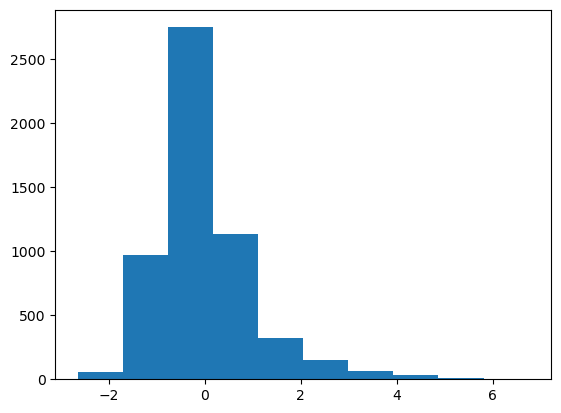

volatile acidity
mean :  -9.300667688555295e-17
variance :  0.9999999999999996
standard deviation :  0.9999999999999998


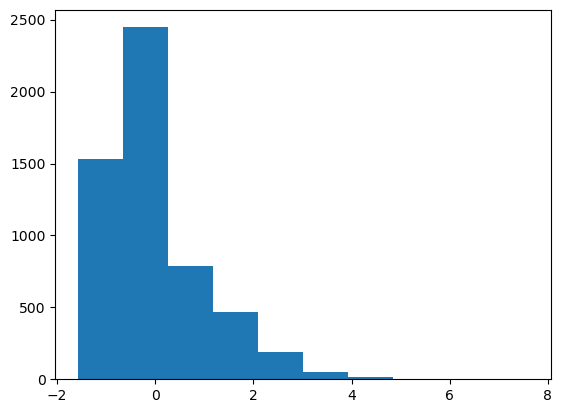

citric acid
mean :  -3.873763436840186e-17
variance :  0.9999999999999912
standard deviation :  0.9999999999999956


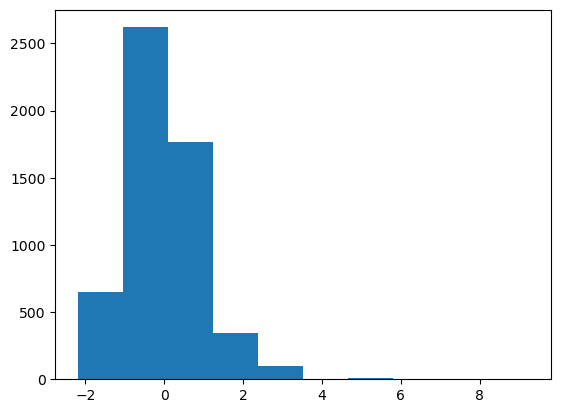

residual sugar
mean :  -3.7323852092182817e-17
variance :  1.0000000000000098
standard deviation :  1.0000000000000049


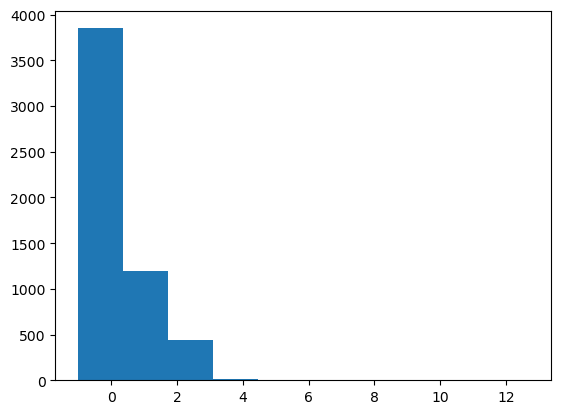

chlorides
mean :  2.5639951423715413e-17
variance :  1.0000000000000049
standard deviation :  1.0000000000000024


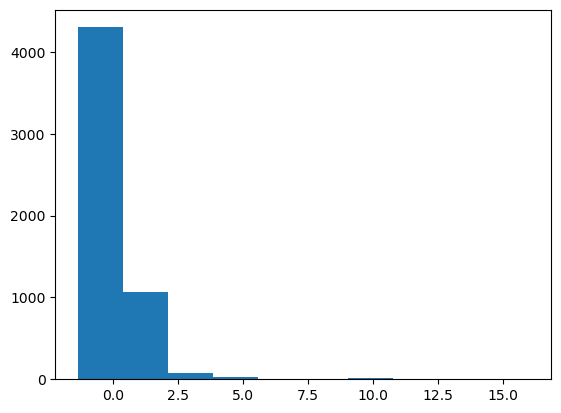

free sulfur dioxide
mean :  -5.590499057963313e-17
variance :  0.9999999999999999
standard deviation :  0.9999999999999999


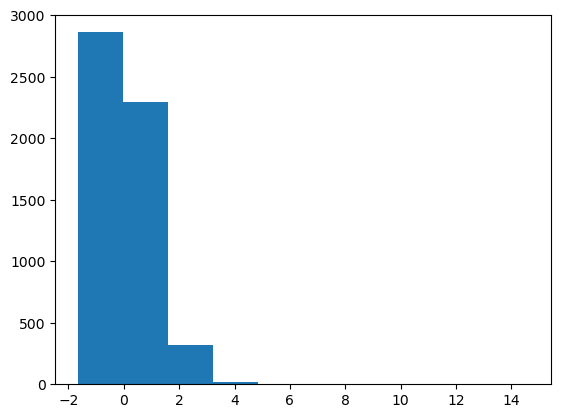

total sulfur dioxide
mean :  6.332734752978312e-17
variance :  0.9999999999999939
standard deviation :  0.9999999999999969


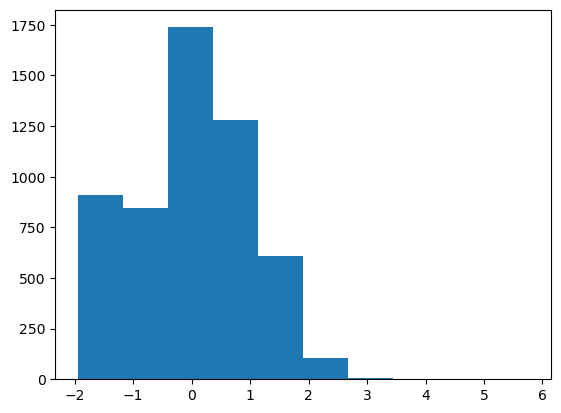

density
mean :  1.9805070000862806e-14
variance :  0.9999999999999943
standard deviation :  0.9999999999999971


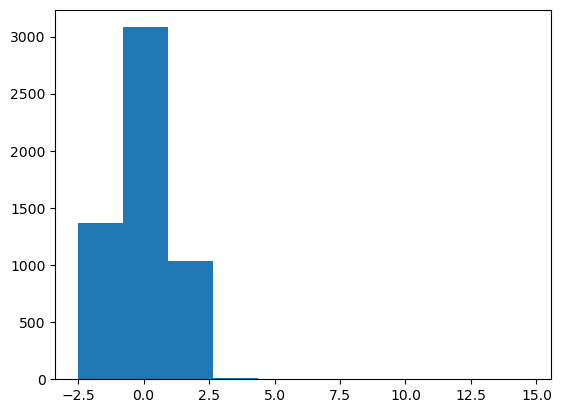

pH
mean :  2.223556370257995e-15
variance :  1.0000000000000016
standard deviation :  1.0000000000000007


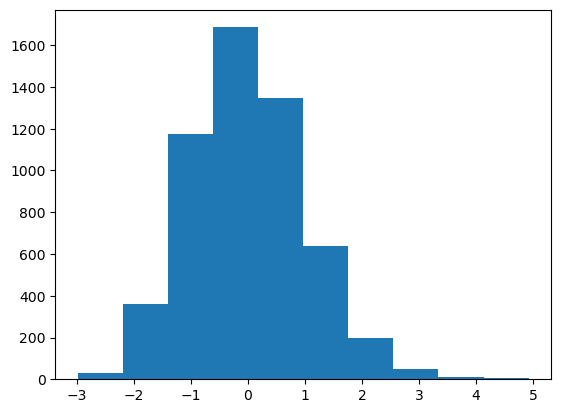

sulphates
mean :  1.0058051050815498e-17
variance :  0.9999999999999939
standard deviation :  0.9999999999999969


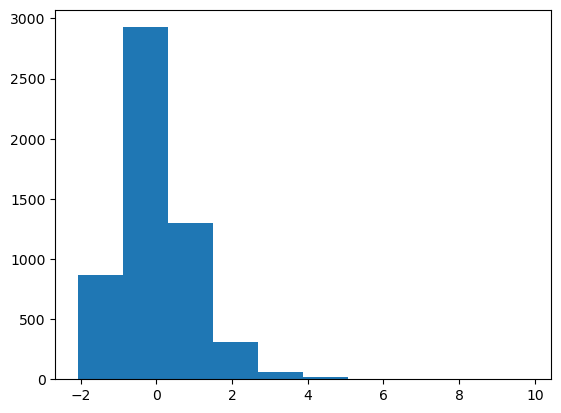

alcohol
mean :  -2.348494329696438e-16
variance :  0.9999999999999967
standard deviation :  0.9999999999999983


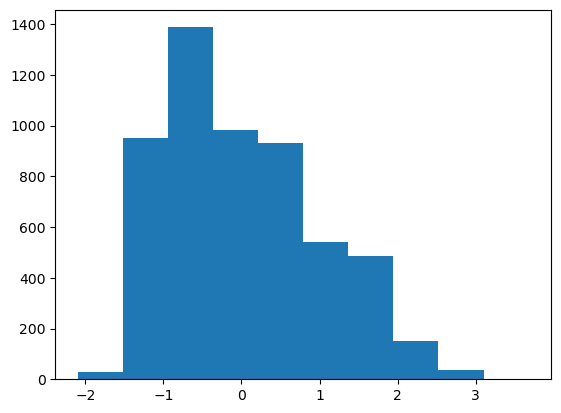

In [72]:
import numpy as np
# 분포 확인 평균이 0 이고 분산이 1 인지 확인
for column in numerical_columns:
    print(column)
    print("mean : ", np.mean(train[column]))
    print("variance : ", np.var(train[column]))
    print("standard deviation : ", np.std(train[column]))
    plt.hist(train[column])
    plt.show()

In [75]:
# 설명변수 종속변수 지정 
X = train.drop('type', axis = 1)
y = train['type']

In [76]:
# 데이터 나누기
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=.2, random_state=42)

In [94]:
# 데이터 타입 변경 
print(X_train.shape, X_test.shape)
y_train=y_train.astype('int')
y_test = y_test.astype('int')

In [95]:
#모델 fitting
rf= RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [107]:
#feature importance 
ftr_df=pd.concat([pd.DataFrame(X_train.columns),pd.DataFrame(feature_y)], axis = 1)
ftr_df.columns = ['columns','featureimportance']
ftr_df

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='columns', ylabel='featureimportance'>

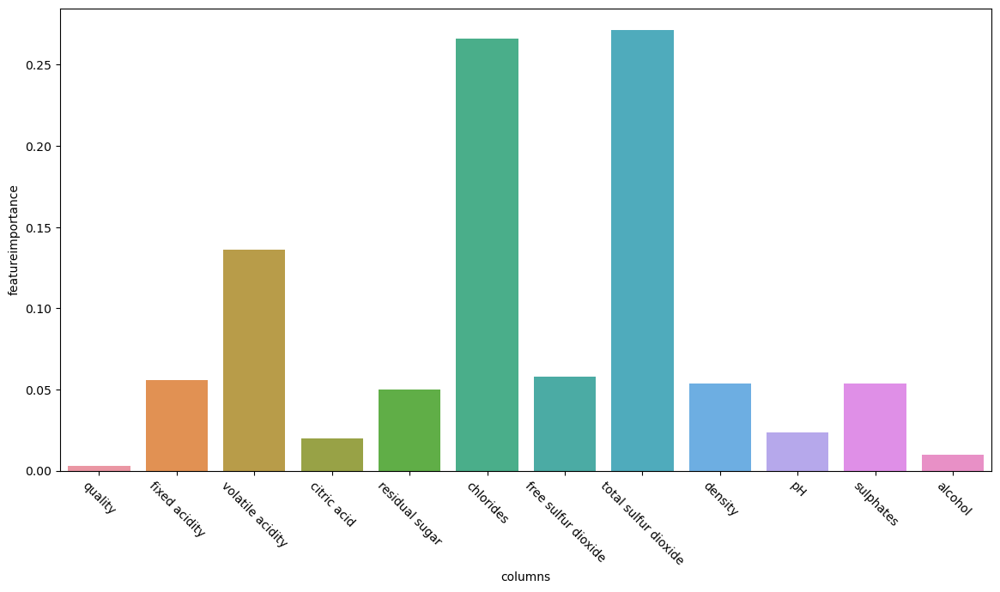

In [115]:
# feature importance 확인
feature_y = rf.feature_importances_
plt.figure(figsize = (14,7))
plt.xticks(rotation=-45)
sns.barplot(ftr_df['columns'],ftr_df['featureimportance'])

In [122]:
# 모델 훈련 및 예측 결과
def Model(model):
    model.fit(X_train,y_train)
    score = model.score(X_test,y_test)
    model_train_score= model.score(X_train,y_train)
    model_test_score=model.score(X_test,y_test)
    prediction = model.predict(X_test)
    cm = confusion_matrix(y_test, prediction)
    print("Testing Score\n", score)
    plot_confusion_matrix(model,X_test,y_test,cmap='OrRd')

Testing Score
 0.9936363636363637


C:\Users\user\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


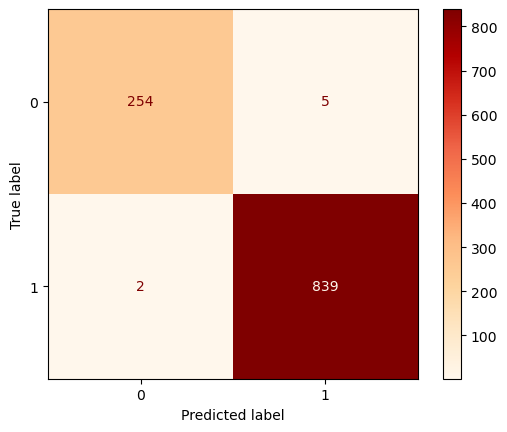

In [124]:
Model(rf)